In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.tri as tri
from sklearn.metrics.pairwise import cosine_distances
from scipy.spatial.distance import pdist, cosine
from scipy.cluster.hierarchy import linkage, optimal_leaf_ordering, dendrogram, leaves_list
import seaborn as sns
from scipy.stats import gaussian_kde
from openTSNE import TSNE

original = "baseline"
channels = ["DNA", "RNA", "AGP", "ER", "Mito"]
colors = ['#808080', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

f_cols = list(map(str, range(672)))

baseline_features = pd.read_csv(f"features/{original}_wells.csv")[f_cols]
channel_features = {ch: pd.read_csv(f"features/{ch}_wells.csv")[f_cols] for ch in channels}

# Info

- 5 eksperimentov (profiliranje). Za vsako profiliranje je za specifičen kanal uporabljena povprečna slika (povprečje pixlov kanala v datasetu).

## t-SNE - t-distributed Stochastic Neighbor Embedding
- Nonlinear dimensionality reduction
- Implemented with [openTSNE](https://opentsne.readthedocs.io/en/latest/index.html#)

```perplexity```: number of nearest neighbors for each point

```early_exaggeration```: control tightness with which t-SNE will try to keep points together in the map space, higher value results in clusters more tightly drawn together

```n_iter```: number of iterations for optimization

In [14]:
chnls = ["AGP", "Mito", "RNA", "ER", "DNA"]

open_tsne = TSNE()
tsne_embeddings = dict()
bt = open_tsne.fit(np.array(baseline_features))

for ch, f in channel_features.items():
    tsne_embeddings[ch] = bt.transform(np.array(f))

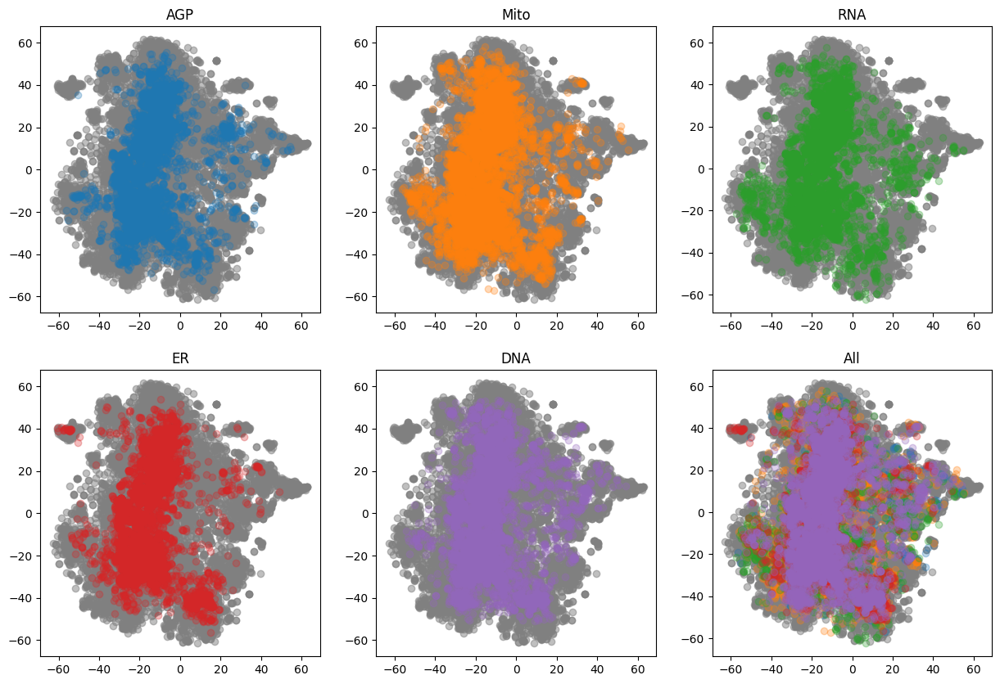

In [ ]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

for i, ch in enumerate(chnls):
    t = tsne_embeddings[ch]
    
    if i == 0:
        ax.flatten()[-1].scatter(bt[:,0], bt[:,1], alpha=0.5, label='Original', color=colors[0])
        ax.flatten()[-1].set_title("All")

    ax.flatten()[i].scatter(bt[:,0], bt[:,1], alpha=0.5, label='Original', color=colors[0])
    ax.flatten()[i].scatter(t[:,0], t[:,1], alpha=0.3, label=ch, color=colors[i + 1])
    ax.flatten()[i].set_title(str(ch))

    ax.flatten()[-1].scatter(t[:,0], t[:,1], alpha=0.3, label=ch, color=colors[i + 1])

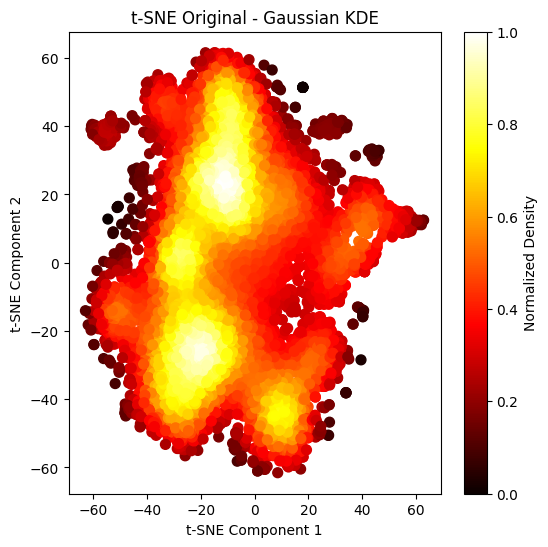

In [ ]:
x = bt[:, 0]
y = bt[:, 1]
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

z_normalized = (z - z.min()) / (z.max() - z.min())

plt.figure(figsize=(8, 8))
plt.scatter(x, y, c=z_normalized, cmap='hot', s=50)
plt.colorbar(label='Normalized Density')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Original - Gaussian KDE')
plt.show()

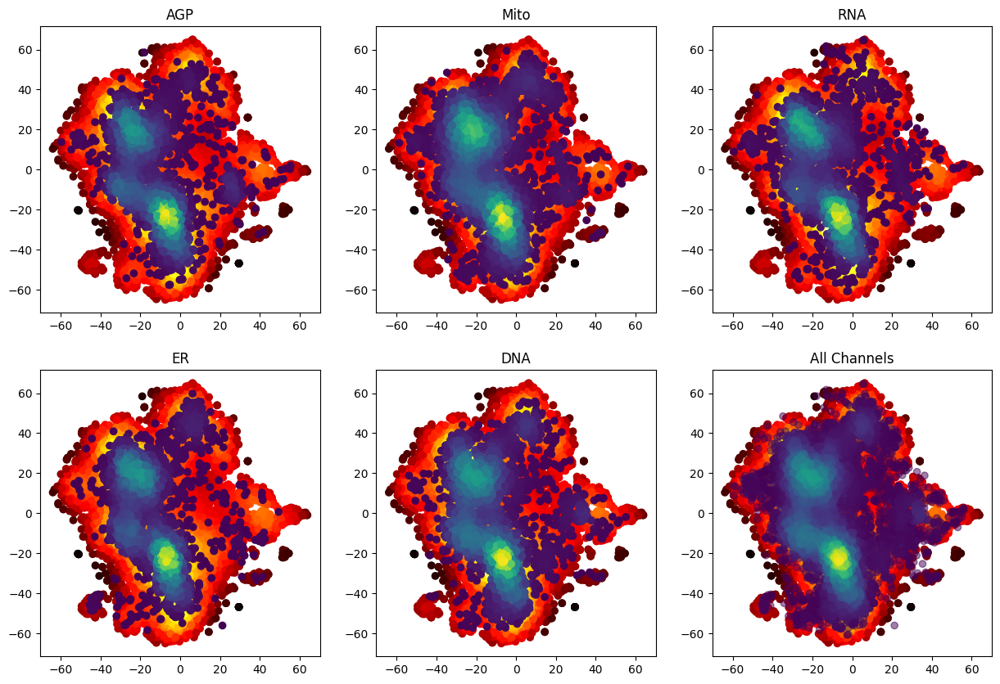

In [25]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

x1 = bt[:, 0]
y1 = bt[:, 1]
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
z1_normalized = (z1 - z1.min()) / (z1.max() - z1.min())

all_x2 = []
all_y2 = []
all_z2_normalized = []

for i, ch in enumerate(chnls):
    t = tsne_embeddings[ch]
    x2 = t[:, 0]
    y2 = t[:, 1]
    xy2 = np.vstack([x2, y2])
    z2 = gaussian_kde(xy2)(xy2)
    z2_normalized = (z2 - z2.min()) / (z2.max() - z2.min())

    ax.flatten()[i].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
    ax.flatten()[i].scatter(x2, y2, c=z2_normalized, cmap='viridis', label=ch)
    ax.flatten()[i].set_title(str(ch))

    all_x2.extend(x2)
    all_y2.extend(y2)
    all_z2_normalized.extend(z2_normalized)

ax.flatten()[-1].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
ax.flatten()[-1].scatter(all_x2, all_y2, c=all_z2_normalized, cmap='viridis', label='All Channels', alpha=0.5)
ax.flatten()[-1].set_title('All Channels')

plt.show()

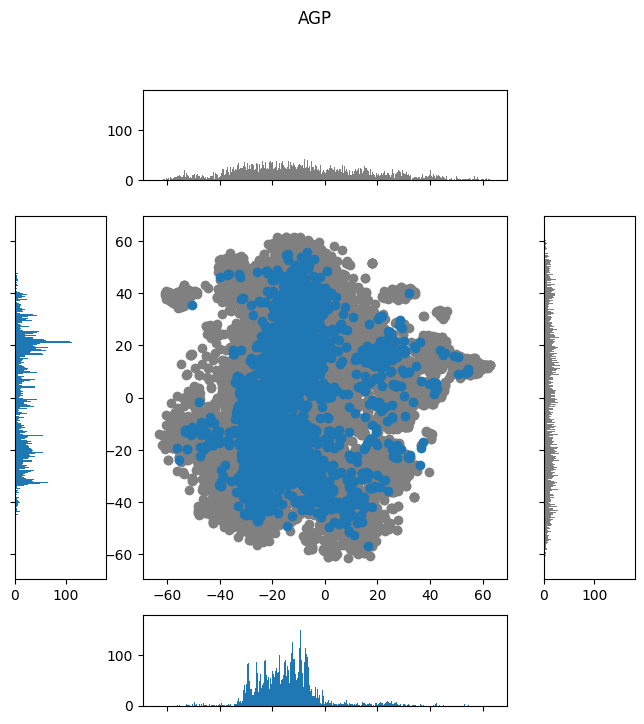

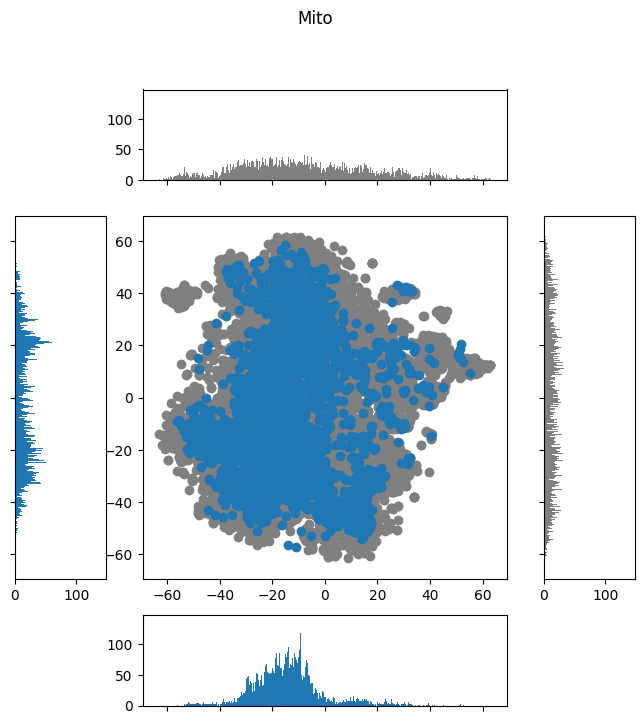

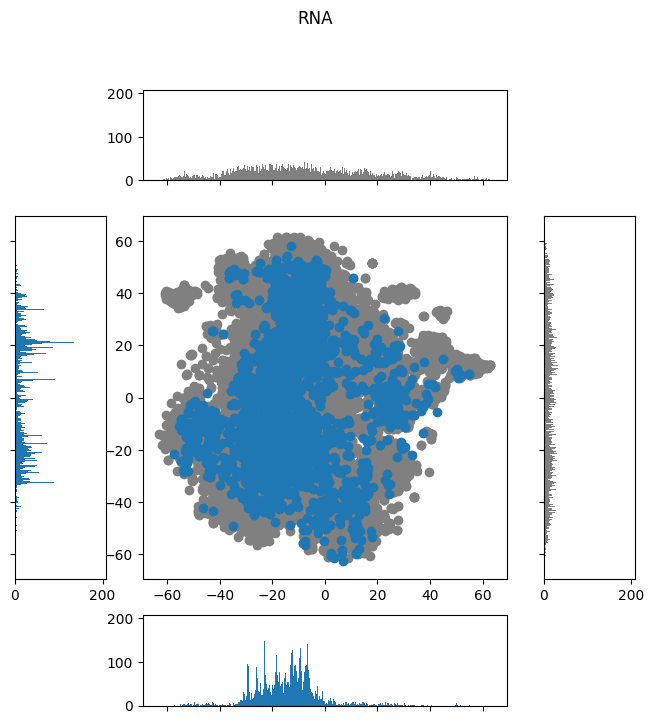

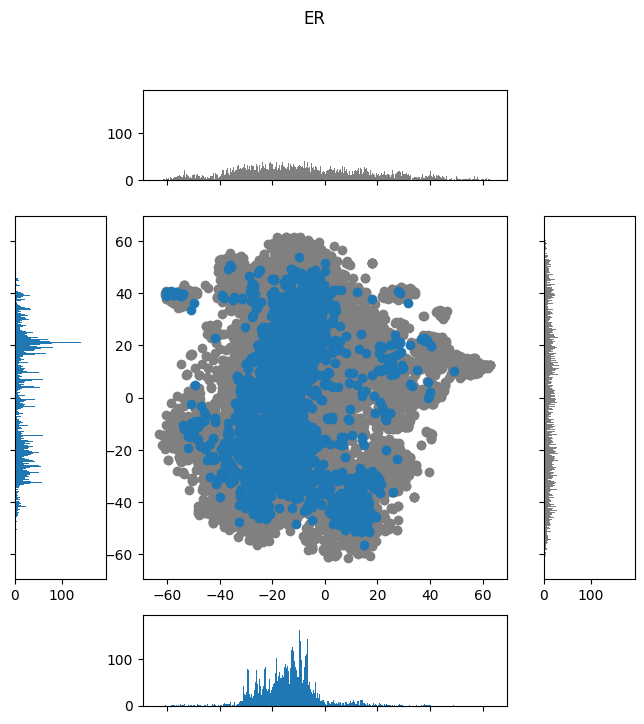

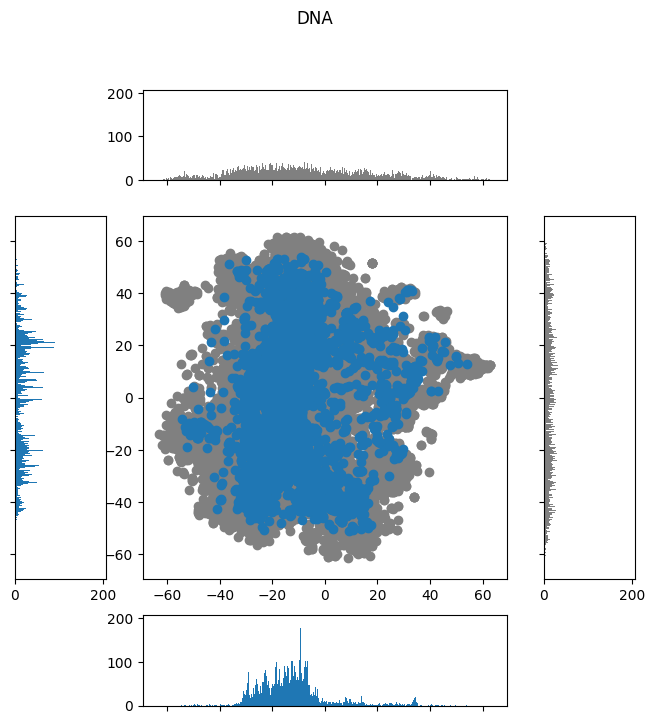

In [6]:
x = bt[:, 0]
y = bt[:, 1]

for ch in chnls:

    ct = tsne_embeddings[ch]
    cx = ct[:, 0]
    cy = ct[:, 1]

    fig = plt.figure(figsize=(8, 8))
    fig.suptitle(ch)
    gs = fig.add_gridspec(3, 3, width_ratios=(1, 4, 1), height_ratios=(1, 4, 1))

    ax = fig.add_subplot(gs[1, 1])
    ax_histx1 = fig.add_subplot(gs[0, 1], sharex=ax)
    ax_histy1 = fig.add_subplot(gs[1, 2], sharey=ax)

    ax_histx2 = fig.add_subplot(gs[2, 1], sharex=ax)
    ax_histy2 = fig.add_subplot(gs[1, 0], sharey=ax)

    ax_histx1.tick_params(axis="x", labelbottom=False)
    ax_histy1.tick_params(axis="y", labelleft=False)

    ax.scatter(x, y, color=colors[0])
    ax.scatter(cx, cy, color=colors[1])

    binwidth = 0.25
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)), np.max(np.abs(cx)), np.max(np.abs(cy)))
    lim = (int(xymax / binwidth) + 1) * binwidth

    bins = np.arange(-lim, lim + binwidth, binwidth)
    counts_x, _ = np.histogram(np.concatenate([x, cx]), bins=bins)
    counts_y, _ = np.histogram(np.concatenate([y, cy]), bins=bins)

    max_count = max(max(counts_x), max(counts_y))

    ax_histx1.hist(x, bins=bins, color=colors[0])
    ax_histy1.hist(y, bins=bins, color=colors[0], orientation='horizontal')
    ax_histx2.hist(cx, bins=bins, color=colors[1])
    ax_histy2.hist(cy, bins=bins, color=colors[1], orientation='horizontal')

    ax_histx1.set_ylim(0, max_count)
    ax_histy1.set_xlim(0, max_count)
    ax_histx2.set_ylim(0, max_count)
    ax_histy2.set_xlim(0, max_count)

    ax_histx2.tick_params(axis="x", labelbottom=False)
    ax_histy2.tick_params(axis="y", labelleft=False)

    plt.show()

# Treatment level

Mean features grouped by treatment (Example: `BRD-A62421304-004-05-6@2.373335218077941`, `Negative@0`)


In [15]:
baseline_tf = pd.read_csv(f"features/{original}_wells.csv").groupby("Treatment").mean().reset_index()[f_cols]
channel_tf = {ch: pd.read_csv(f"features/{ch}_wells.csv").groupby("Treatment").mean().reset_index()[f_cols] for ch in channels}

open_tsne = TSNE()
bt_tf = open_tsne.fit(np.array(baseline_tf))
tsne_embeddings_tf = {ch: bt_tf.transform(np.array(f)) for ch, f in channel_tf.items()}

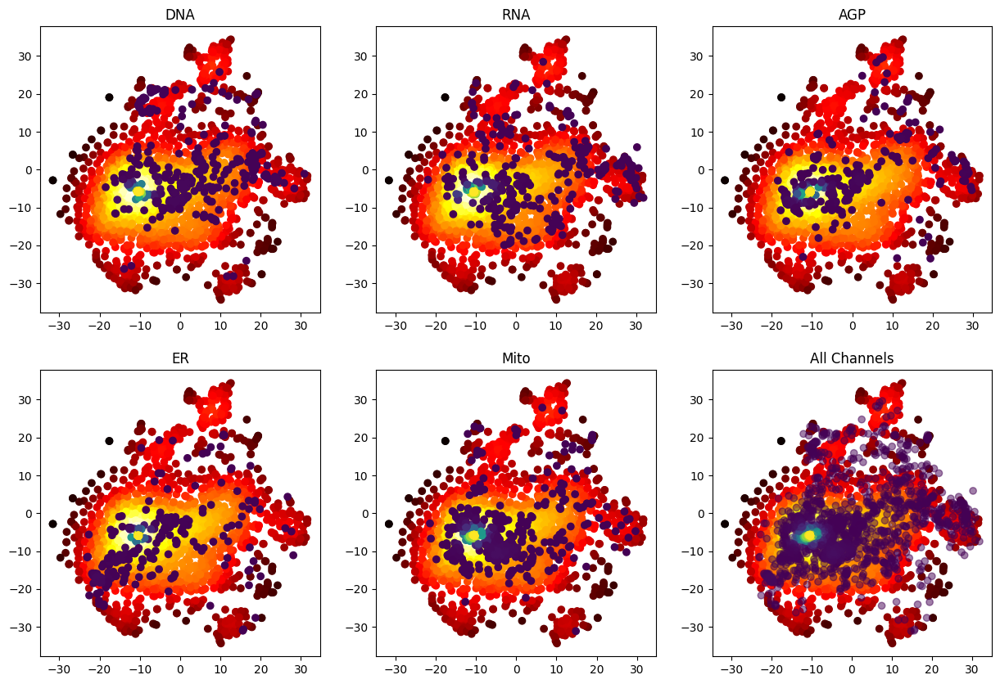

In [24]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

x1 = bt_tf[:, 0]
y1 = bt_tf[:, 1]
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
z1_normalized = (z1 - z1.min()) / (z1.max() - z1.min())

all_x2 = []
all_y2 = []
all_z2_normalized = []

for i, ch in enumerate(tsne_embeddings_tf.keys()):
    t = tsne_embeddings_tf[ch]
    x2 = t[:, 0]
    y2 = t[:, 1]
    xy2 = np.vstack([x2, y2])
    z2 = gaussian_kde(xy2)(xy2)
    z2_normalized = (z2 - z2.min()) / (z2.max() - z2.min())

    ax.flatten()[i].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
    ax.flatten()[i].scatter(x2, y2, c=z2_normalized, cmap='viridis', label=ch)
    ax.flatten()[i].set_title(str(ch))

    all_x2.extend(x2)
    all_y2.extend(y2)
    all_z2_normalized.extend(z2_normalized)

ax.flatten()[-1].scatter(x1, y1, c=z1_normalized, cmap='hot', label='Original')
ax.flatten()[-1].scatter(all_x2, all_y2, c=all_z2_normalized, cmap='viridis', label='All Channels', alpha=0.5)
ax.flatten()[-1].set_title('All Channels')

plt.show()

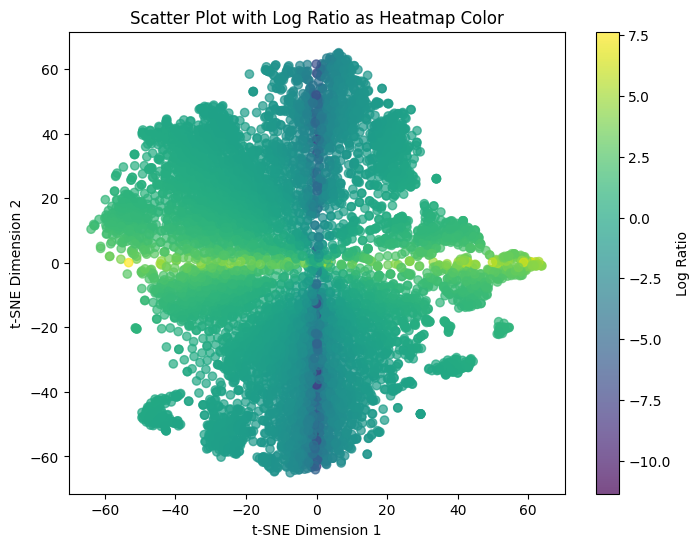

In [78]:
from scipy.interpolate import griddata

baseline_features_df = pd.read_csv(f"features/{original}_wells.csv")
baseline_features_df = baseline_features_df[["Treatment"]]

baseline_features_df.loc[:, "tsne_x"] = list(bt[:, 0])
baseline_features_df.loc[:, "tsne_y"] = list(bt[:, 1])

# Compute the ratio between dimensions
ratio = bt[:, 0] / bt[:, 1]

# Take the absolute value of the ratio to handle negative values
abs_ratio = np.abs(ratio)

# Take the logarithm of the absolute ratio
log_ratio = np.log(abs_ratio)

# Plot scatter plot with log_ratio as heatmap color
plt.figure(figsize=(8, 6))
plt.scatter(bt[:, 0], bt[:, 1], c=log_ratio, cmap='viridis', alpha=0.7)
plt.colorbar(label='Log Ratio')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('Scatter Plot with Log Ratio as Heatmap Color')
plt.show()

# Streamplot

- Used to display 2D vector field
- Parameters:
    - `X`, `Y`: values (for each of the 2 axis) of OpenTSNE embeddings of original features
    - `U`, `V`: substracting x, y coordinates from Original and Channel embeddings. Represent directinal changes from Original to Channel embeddings

In [17]:
def get_streamplot(bt, ct):
    """Create a vector field representation for 2D data. Calculates the difference between two sets of features and then interpolates these vector differences
    onto a regular grid."""

    X, Y = bt[:, 0], bt[:, 1]
    U, V = ct[:, 0] - bt[:, 0], ct[:, 1] - bt[:, 1]

    # Grid over the embedding space
    grid_x, grid_y = np.linspace(min(X), max(X), 100), np.linspace(min(Y), max(Y), 100)
    grid_u, grid_v = np.meshgrid(grid_x, grid_y)

    # Interpolating the vector data onto the grid
    velocity_u = griddata((X, Y), U, (grid_u, grid_v), method='nearest')
    velocity_v = griddata((X, Y), V, (grid_u, grid_v), method='nearest')

    # Handle NaN values if necessary
    velocity_u = np.nan_to_num(velocity_u)
    velocity_v = np.nan_to_num(velocity_v)

    return grid_x, grid_y, velocity_u, velocity_v

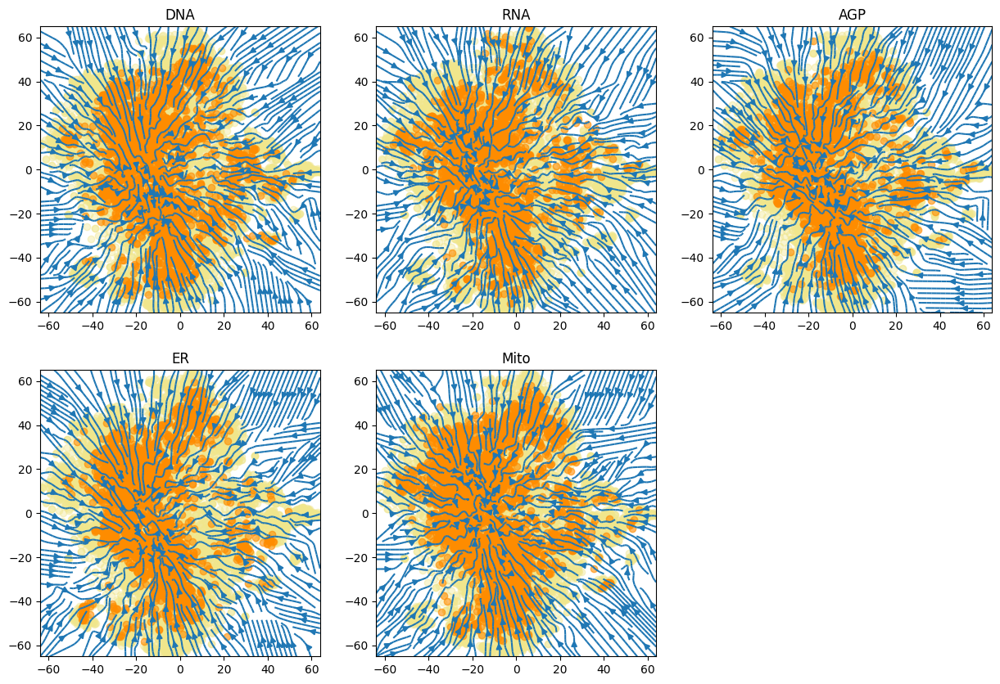

In [18]:
fig, ax = plt.subplots(2,3, figsize=(15,10))
ax.flat[-1].set_visible(False)

for i, ch in enumerate(tsne_embeddings.keys()):
    ct = tsne_embeddings[ch]
    grid_x, grid_y, velocity_u, velocity_v = get_streamplot(bt, ct)   
    
    ax.flat[i].streamplot(grid_x, grid_y, velocity_u, velocity_v, density=2)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].scatter(bt[:, 0], bt[:, 1], color='khaki', alpha=0.4)
    ax.flat[i].scatter(ct[:, 0], ct[:, 1], color='darkorange', alpha=0.6)

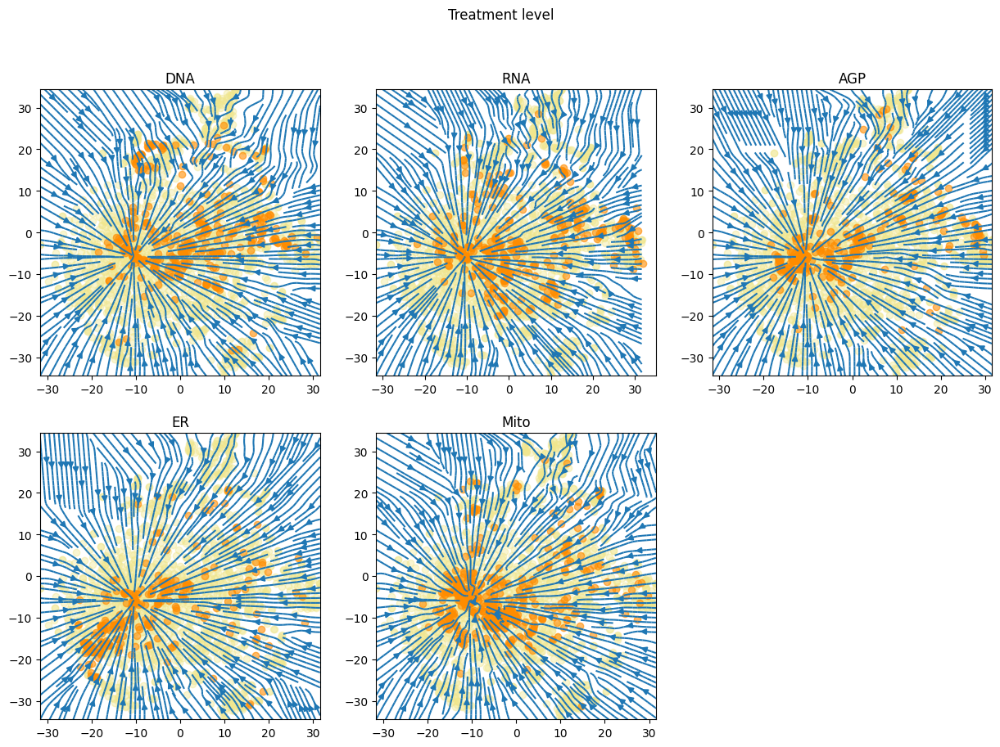

In [21]:
fig, ax = plt.subplots(2,3, figsize=(15,10))
fig.suptitle("Treatment level")
ax.flat[-1].set_visible(False)

for i, ch in enumerate(tsne_embeddings_tf.keys()):
    ct = tsne_embeddings_tf[ch]
    grid_x, grid_y, velocity_u, velocity_v = get_streamplot(bt_tf, ct)   
    
    ax.flat[i].streamplot(grid_x, grid_y, velocity_u, velocity_v, density=2)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].scatter(bt_tf[:, 0], bt_tf[:, 1], color='khaki', alpha=0.4)
    ax.flat[i].scatter(ct[:, 0], ct[:, 1], color='darkorange', alpha=0.6)

# Tricountours

- `Triangulation`: organizes random data points into a triangular mesh

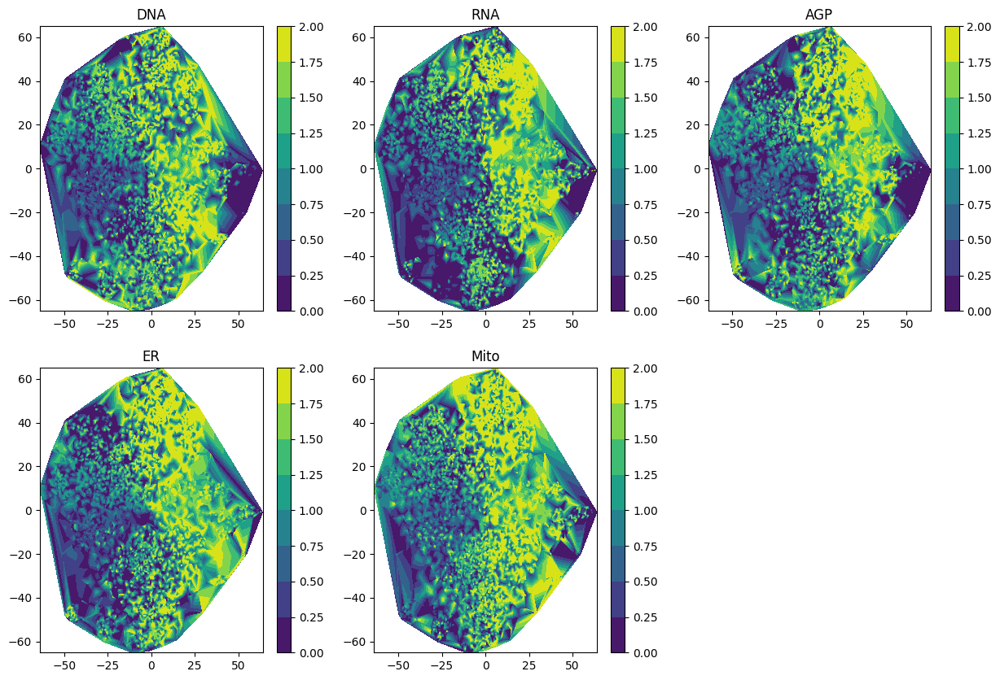

In [22]:
X, Y = bt[:, 0], bt[:, 1]
triang = tri.Triangulation(X, Y)

fig, ax = plt.subplots(2,3, figsize=(15,10))
ax.flat[-1].set_visible(False)

for i, ch in enumerate(tsne_embeddings.keys()):
    ct = tsne_embeddings[ch]
    Z = cosine_distances(bt, ct)
    cntr = ax.flat[i].tricontourf(triang, Z.diagonal())
    plt.colorbar(cntr, ax=ax.flat[i])
    ax.flat[i].set_title(str(ch))

# KDE - Kernel Density Estimation

- `seaborn.sns.kdeplot`: Plot each set of (7664x2) features/embeddings from OpenTSNE.

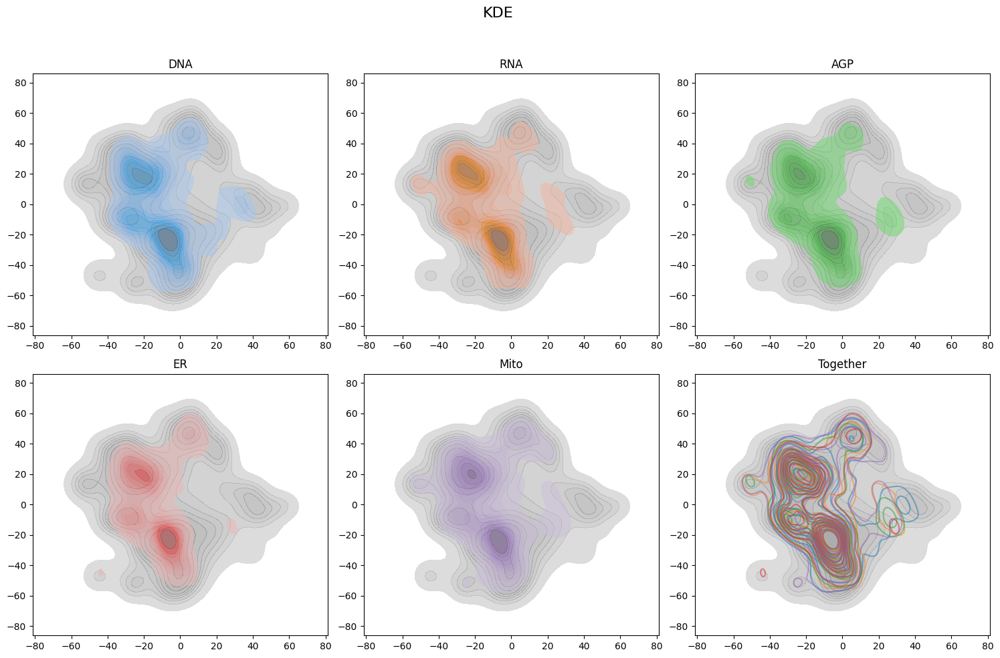

In [23]:
fig, ax = plt.subplots(2,3, figsize=(15,10))

for i, ch in enumerate(tsne_embeddings.keys()):
    ct = tsne_embeddings[ch]
    
    sns.kdeplot(x=bt[:, 0], y=bt[:, 1], color=colors[0], ax=ax.flat[i], fill=True, alpha=0.5)
    sns.kdeplot(x=ct[:, 0], y=ct[:, 1], color=colors[i + 1], ax=ax.flat[i], fill=True, alpha=0.5)
    ax.flat[i].set_title(str(ch))

    if i == 0:
        sns.kdeplot(x=bt[:, 0], y=bt[:, 1], color=colors[0], ax=ax.flat[-1], fill=True, alpha=0.5)
        ax.flat[-1].set_title("Together")
    sns.kdeplot(x=ct[:, 0], y=ct[:, 1], color=colors[i + 1], ax=ax.flat[-1], fill=False, alpha=0.5)

fig.suptitle("KDE", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)

# Optimal Leaf Ordering

In [ ]:
# Compute the pairwise distances between cells
distance_matrix = pdist(bt, metric='cosine')

# Step 2: Perform the hierarchical clustering
linked = linkage(distance_matrix, method='ward')

# Step 3: Optimal leaf ordering
ordered_linked = optimal_leaf_ordering(linked, distance_matrix)

plt.figure(figsize=(10, 7))
dendrogram(ordered_linked)
plt.title('Hierarchical Clustering with Optimal Leaf Ordering')

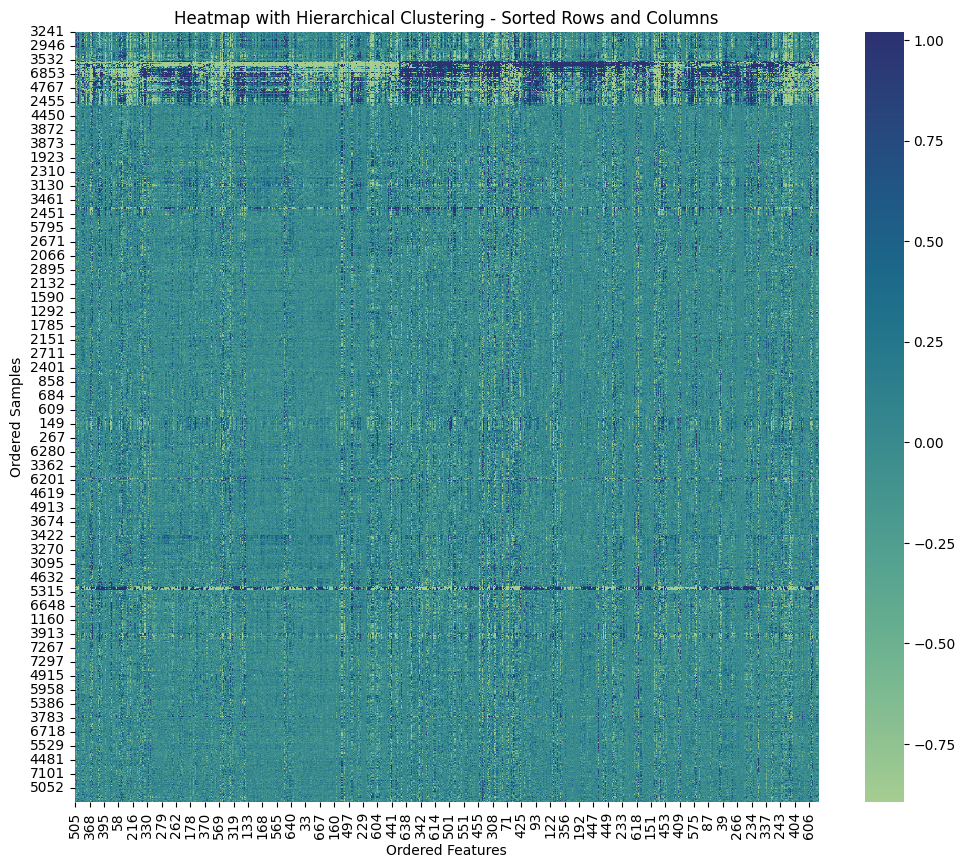

In [26]:
def heatmap_order_features(features):
    # Compute the pairwise distances between rows and columns
    row_distances = pdist(features, metric='cosine')
    col_distances = pdist(features.T, metric='cosine')

    # Perform hierarchical clustering for rows and columns separately
    row_clusters = linkage(row_distances, method='ward')
    col_clusters = linkage(col_distances, method='ward')

    # Obtain the order of rows and columns according to the clustering
    row_order = leaves_list(row_clusters)
    col_order = leaves_list(col_clusters)

    # Reorder the DataFrame according to the clustering for rows and columns
    ordered_features = features.iloc[row_order, col_order]

    return ordered_features

# Assuming baseline_features is defined
bh = heatmap_order_features(baseline_features)

plt.figure(figsize=(12, 10))
sns.heatmap(bh, cmap='crest', robust=True)
plt.title('Heatmap with Hierarchical Clustering - Sorted Rows and Columns')
plt.xlabel('Ordered Features')
plt.ylabel('Ordered Samples')
plt.show()

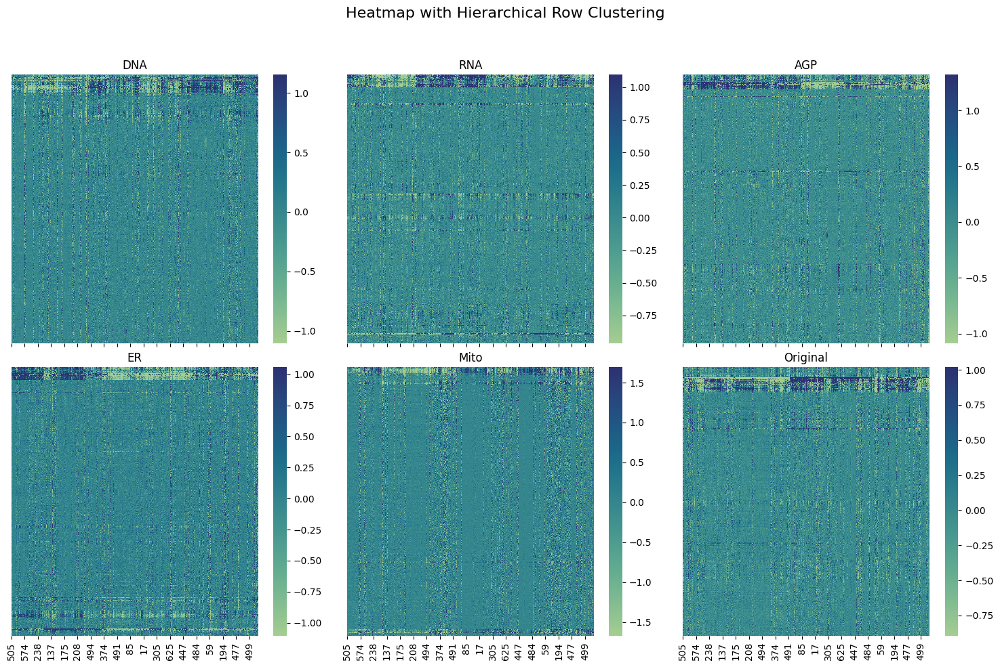

In [27]:
fig, ax = plt.subplots(2,3, figsize=(15,10), sharex=True)

for i, ch in enumerate(channel_features.keys()):
    
    ch_hm = heatmap_order_features(channel_features[ch])
    sns.heatmap(ch_hm, cmap='crest', yticklabels=False, robust=True, ax=ax.flat[i])    
    ax.flat[i].set_title(str(ch))

ax.flat[-1].set_title("Original")
sns.heatmap(bh, cmap='crest', yticklabels=False, robust=True, ax=ax.flat[-1])    

fig.suptitle("Heatmap with Hierarchical Row Clustering", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
plt.show()

# Mean differences between sets of features

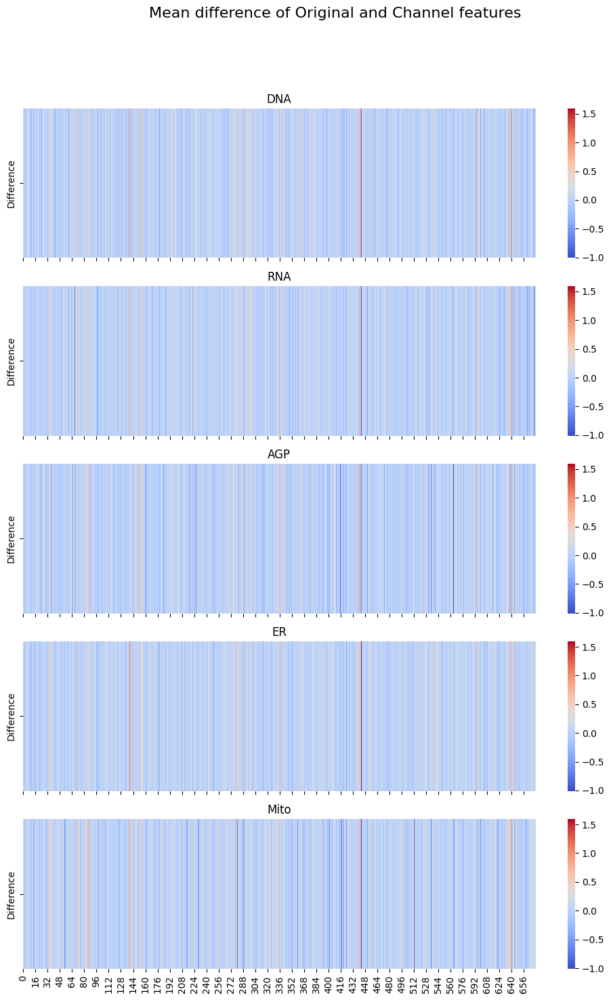

In [ ]:
global_min = float('inf')
global_max = float('-inf')

for ch in channel_features.keys():
    mean_diff = (baseline_features - channel_features[ch]).mean(axis=0)
    global_min = min(global_min, mean_diff.min())
    global_max = max(global_max, mean_diff.max())

fig, ax = plt.subplots(5,1, figsize=(10,15), sharex=True, sharey=True)

for i, ch in enumerate(channel_features.keys()):

    mean_diff = pd.DataFrame((baseline_features - channel_features[ch]).mean(axis=0), columns=['Difference']).transpose()
    sns.heatmap(mean_diff, cmap='coolwarm', ax=ax[i], vmin=global_min, vmax=global_max)
    ax.flat[i].set_title(str(ch))

fig.suptitle("Mean difference of Original and Channel features", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)

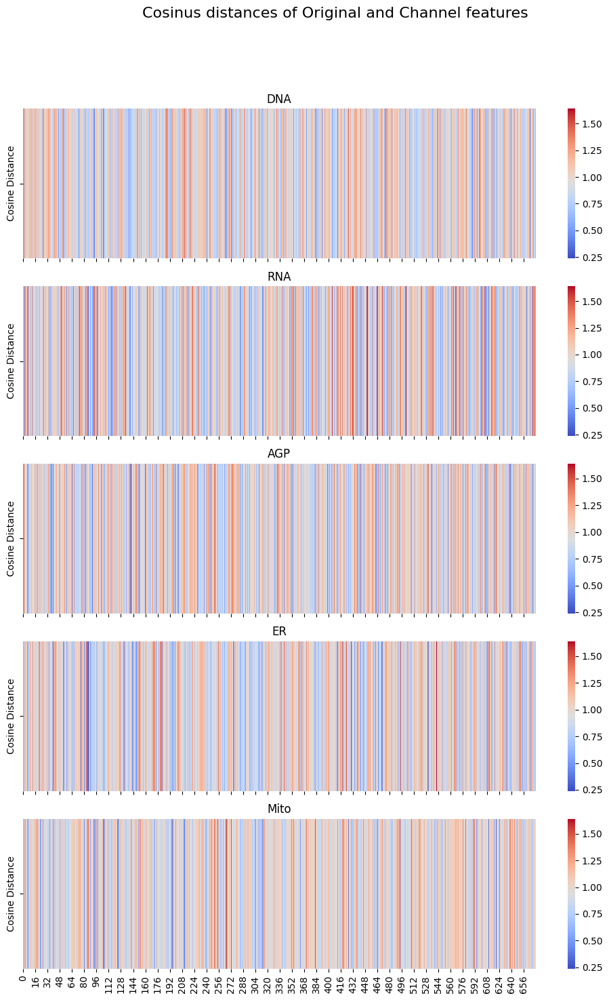

In [ ]:
global_min = float('inf')
global_max = float('-inf')

for ch in channel_features.keys():
    cos_distances = [cosine(baseline_features.iloc[:, i], channel_features[ch].iloc[:, i]) for i in range(baseline_features.shape[1])]
    global_min = min(global_min, min(cos_distances))
    global_max = max(global_max, max(cos_distances))

fig, ax = plt.subplots(5,1, figsize=(10,15), sharex=True, sharey=True)

for i, ch in enumerate(channel_features.keys()):
    cos_distances = pd.DataFrame(np.array([cosine(baseline_features.iloc[:, i], channel_features[ch].iloc[:, i]) for i in range(baseline_features.shape[1])]), columns=['Cosine Distance'])
    sns.heatmap(cos_distances.T, cmap='coolwarm', ax=ax[i], vmin=global_min, vmax=global_max)
    ax.flat[i].set_title(str(ch))

fig.suptitle("Cosinus distances of Original and Channel features", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)


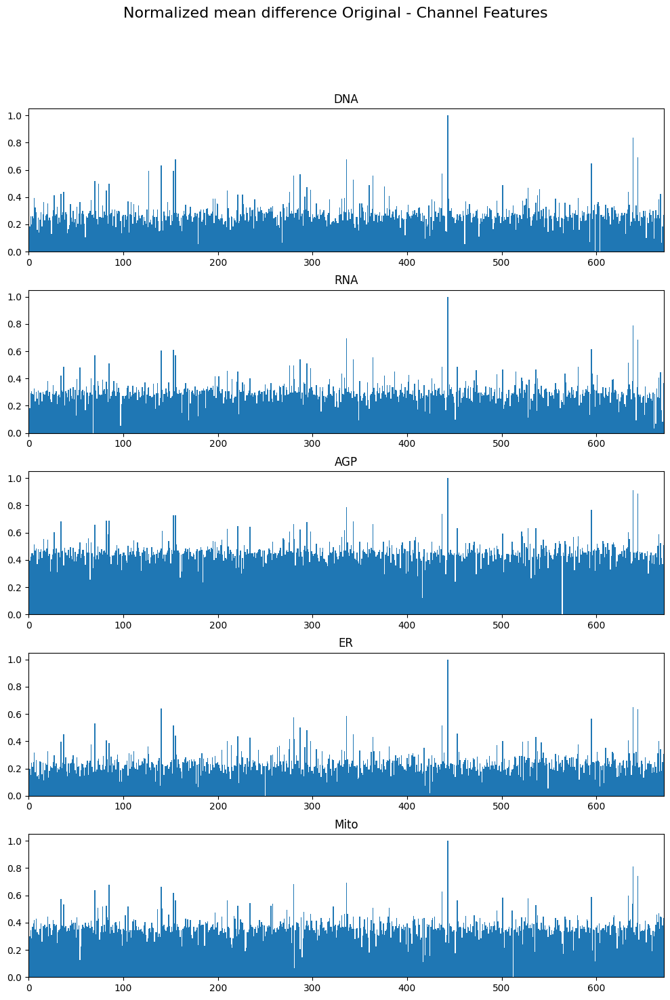

In [ ]:
fig, ax = plt.subplots(5,1, figsize=(10,15))

for i, ch in enumerate(channel_features.keys()):
    
    mean_diff = (np.array(baseline_features) - np.array(channel_features[ch])).mean(axis=0)
    mean_diff_norm = ((mean_diff - mean_diff.min()) / (mean_diff.max() - mean_diff.min()))

    ax.flat[i].bar(list(range(672)), mean_diff_norm, width=1)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].margins(x=0)

fig.suptitle("Normalized mean difference Original - Channel Features", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)

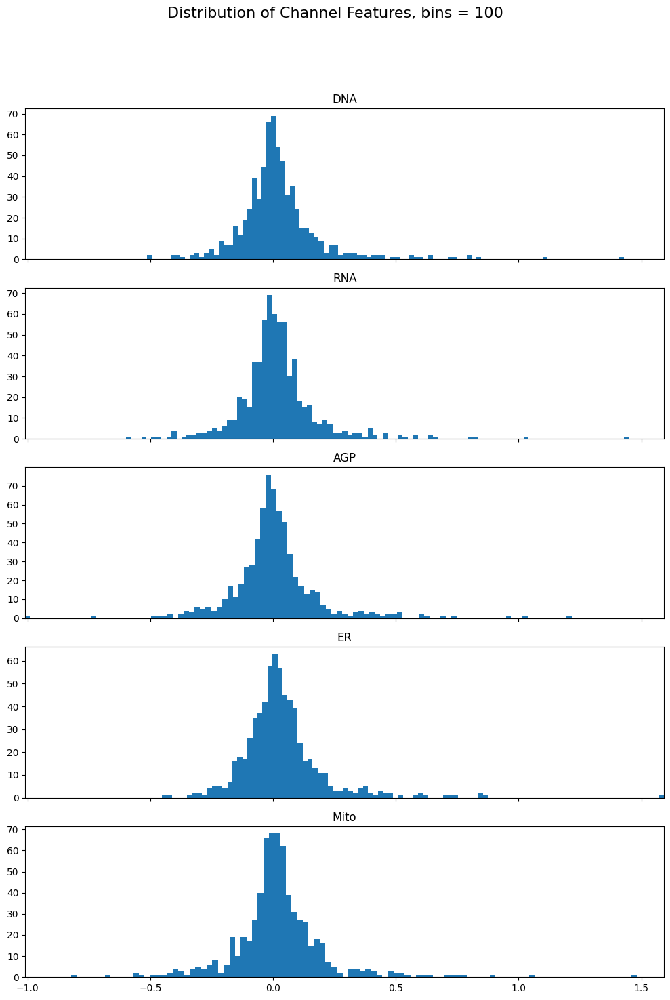

In [ ]:
bins = 100

fig, ax = plt.subplots(5,1, figsize=(10,15), sharex=True)

for i, ch in enumerate(channel_features.keys()):

    mean_diff = (np.array(baseline_features) - np.array(channel_features[ch])).mean(axis=0)
    ax.flat[i].hist(mean_diff, bins=bins)
    ax.flat[i].set_title(str(ch))
    ax.flat[i].margins(x=0)

fig.suptitle(f"Distribution of Channel Features, bins = {bins}", size=16)
fig.tight_layout()
fig.subplots_adjust(top=0.88)